### Project overview

## Details

Business problem addressed:
Classification of whether an airline passenger is satisfied.

Dataset: [Airline Passenger Satisfaction](https://www.kaggle.com/datasets/teejmahal20/airline-passenger-satisfaction/data)



Here is the information about passengers of certain airlines:  

**Gender**: male or female  
**Customer type**: regular or non-regular airline customer  
**Age**: the actual age of the passenger  
**Type of travel**: the purpose of the passenger's travel (personal or business travel)  
**Class**: business, economy, economy plus  
**Flight distance**  
**Inflight wifi service**: satisfaction level with in-flight Wi-Fi service (1-5)  
**Departure/Arrival time convenient**: satisfaction level with departure/arrival times (1-5)  
**Ease of Online booking**: satisfaction level with online booking (1-5)  
**Gate location**: satisfaction level with gate location (1-5)  
**Food and drink**: satisfaction level with food and beverages (1-5)  
**Online boarding**: satisfaction level with online check-in (1-5)  
**Seat comfort**: satisfaction level with seat comfort (1-5)  
**Inflight entertainment**: satisfaction level with in-flight entertainment (1-5)  
**On-board service**: satisfaction level with onboard service (1-5)  
**Leg room service**: satisfaction level with legroom space (1-5)  
**Baggage handling**: satisfaction level with baggage handling (1-5)  
**Checkin service**: satisfaction level with check-in service (1-5)  
**Inflight service**: satisfaction level with in-flight service (1-5)  
**Cleanliness**: satisfaction level with cleanliness (1-5)  
**Departure delay in minutes**  
**Arrival delay in minutes**  

This dataset contains survey results about airline passenger satisfaction. The classification task is to predict which of the two satisfaction levels a passenger belongs to:  

**Satisfaction**  
**Neutral** or **dissatisfied**  

I use two neural networks:  
- A classical **Feedforward Neural Network (FNN)**  
- A modified **FNN with a quantum layer**  


## EDA

In [1]:
!pip install kagglehub

In [2]:
# zbiór danych 
import kagglehub

# Download latest version
# path = kagglehub.dataset_download("teejmahal20/airline-passenger-satisfaction" )

# print("Path to dataset files:", path)

/opt/homebrew/anaconda3/envs/tsf3.11/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!cp -r {paste_here_path} ./

cp: {paste_here_path}: No such file or directory


In [4]:
!mv  ./1/* ./


mv: rename ./1/* to ./*: No such file or directory


In [5]:
!pip install matplotlib
!pip install seaborn

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [7]:
!pip freeze >>requirements.txt

In [8]:
df = pd.read_csv("train.csv")

In [9]:
df.head()


,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

In [11]:
df.duplicated().sum()

0

In [12]:
df.isnull().sum()

Unnamed: 0                             0
id                                     0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction    

In [13]:
#Fill missing data

df['Arrival Delay in Minutes'].fillna(df['Arrival Delay in Minutes'].median(axis = 0), inplace = True)

/var/folders/6c/lpzhtp9j30l0zz5l3k5299cc0000gn/T/ipykernel_29694/2288570873.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Arrival Delay in Minutes'].fillna(df['Arrival Delay in Minutes'].median(axis = 0), inplace = True)


In [14]:
df = df.drop(df.iloc[:,[0, 1]], axis = 1)

In [15]:
df.describe()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000
mean,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.133392
std,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.649776
min,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [16]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


([<matplotlib.patches.Wedge at 0x16b562350>,
 [Text(-0.22870506272227167, 1.0759618925804026, 'Neutral or dissatisfied'),
  Text(0.228705062722272, -1.0759618925804026, 'Satisfied')],
 [Text(-0.12474821603032998, 0.5868883050438559, '56.7%'),
  Text(0.12474821603033018, -0.5868883050438559, '43.3%')])

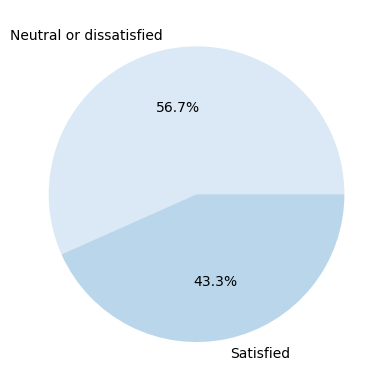

In [17]:
plt.pie(df.satisfaction.value_counts(), labels = ["Neutral or dissatisfied", "Satisfied"], colors = sns.color_palette("Blues"), autopct = '%1.1f%%')

In [18]:
print(df['Customer Type'].value_counts())
print(df['Gender'].value_counts())
print(df['Class'].value_counts())

Customer Type
Loyal Customer       84923
disloyal Customer    18981
Name: count, dtype: int64
Gender
Female    52727
Male      51177
Name: count, dtype: int64
Class
Business    49665
Eco         46745
Eco Plus     7494
Name: count, dtype: int64


<Axes: xlabel='Age', ylabel='Count'>

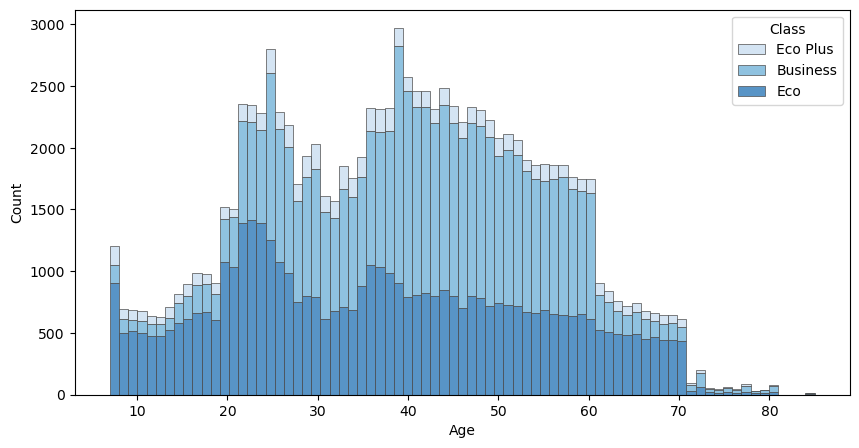

In [19]:
f, ax = plt.subplots(1, 1, figsize = (10,5))
sns.histplot(df, x = "Age", hue = "Class", multiple = "stack", palette = "Blues", edgecolor = ".3", linewidth = .5, ax = ax)

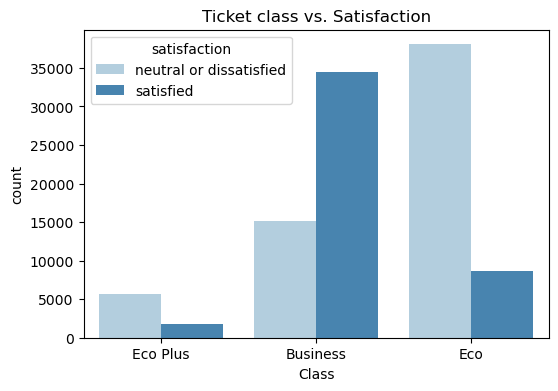

In [20]:
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Class', hue='satisfaction', palette = "Blues")
plt.title('Ticket class vs. Satisfaction')
plt.show()

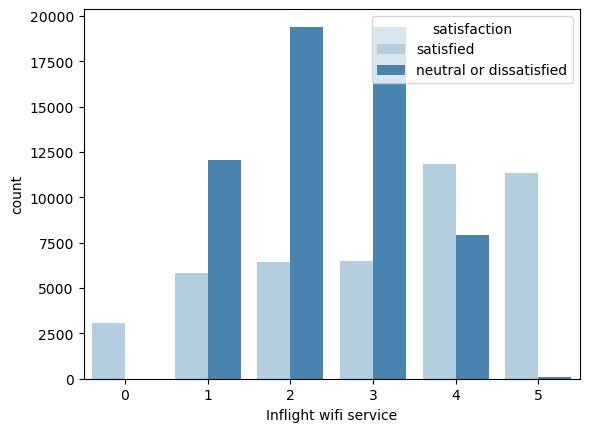

In [21]:
sns.countplot(x = 'Inflight wifi service', hue = 'satisfaction', palette = "Blues", data = df)
plt.show()

In [22]:
col_names= ['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
corr_mat = df[col_names].corr()
corr_mat


,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes
Age,1.000000,0.099461,-0.010152,-0.012105
Flight Distance,0.099461,1.000000,0.002158,-0.002470
Departure Delay in Minutes,-0.010152,0.002158,1.000000,0.960247
Arrival Delay in Minutes,-0.012105,-0.002470,0.960247,1.000000


<Axes: >

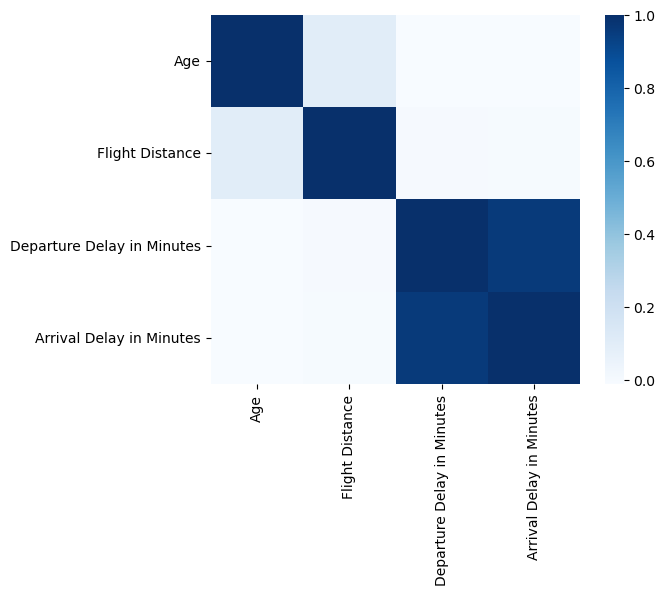

In [23]:
sns.heatmap(corr_mat, square = True, cmap = 'Blues')


## Classic-ML model  

In [28]:
#General data operations library
import math
import string
from datetime import datetime
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


#The tensorflow library
import tensorflow  as tf

#Plotting libraries
import matplotlib as mpl
import matplotlib.pyplot as plt

#Increase plots font size
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (10, 7),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
plt.rcParams.update(params)

#append path with python modules
import importlib
import sys
sys.path.append("./modules")

#Private functions
import plotting_functions as plf
importlib.reload(plf);


In [29]:
def getModel(inputShape, nNeurons, hiddenActivation="relu", outputActivation="linear", nOutputNeurons=1):
   
    inputs = tf.keras.Input(shape=inputShape, name="features")
    x = inputs
    
    for iLayer, n in enumerate(nNeurons):
        x = tf.keras.layers.Dense(n, activation=hiddenActivation, 
                                  kernel_initializer='glorot_uniform',
                                  kernel_regularizer=tf.keras.regularizers.L2(l2=0.01),
                                  name="layer_"+str(iLayer))(x)
        x = tf.keras.layers.Dropout(name="dropout_layer_"+str(iLayer),rate=0.2)(x)
                
    outputs = tf.keras.layers.Dense(nOutputNeurons, activation=outputActivation, name = "output")(x)   
    model = tf.keras.Model(inputs=inputs, outputs=outputs, name="DNN")
    return model

In [30]:
# Encode categorical features
categorical_columns = ['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction']
label_encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

X = df.drop(columns=['satisfaction'])  
y = df['satisfaction']  

#take less data to speed up trainig 
N_train = 28000
N_test = 4000

x_train, x_val, y_train, y_val = train_test_split(
    X, y, 
    train_size = N_train, test_size = N_test,  
    stratify=y,     
    random_state=42 
)


Epoch 45: early stopping
125/125 [==============================] - 0s 353us/step - loss: 0.4377 - Accuracy: 0.8325 - false_positives: 75.0000
('Validation accuracy:', 'blue') 0.8324999809265137
('Validation FPR', 'blue') 0.033083370092633436


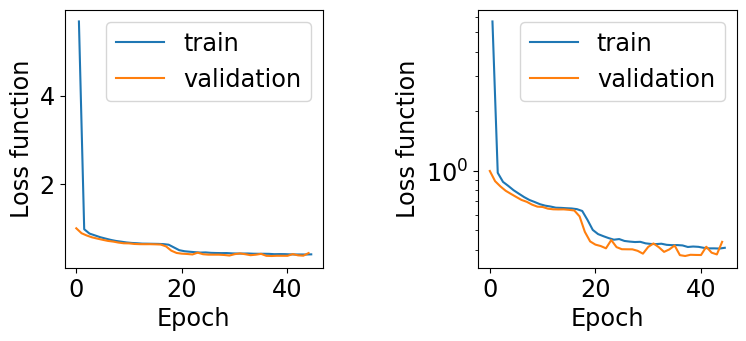

In [31]:
def passengerSatisfaction(x_train, y_train, x_val, y_val):

    #Model definition
    inputShape = (22,)
    nNeurons = np.array([35, 44])
    model = getModel(inputShape, nNeurons, hiddenActivation="relu", outputActivation="sigmoid")

    
    #Training
 
    initial_learning_rate = 1E-3
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate,
                    decay_steps=1000,
                    decay_rate=0.95,
                    staircase=True)
    #delete legacy if not mac m1/m2
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule),
                      loss=tf.keras.losses.BinaryCrossentropy(),
                      metrics=['Accuracy','FalsePositives'])
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, verbose=1)
    
    nEpochs = 95
    history = model.fit(x=x_train, y=y_train, 
                        epochs=nEpochs, 
                        batch_size = 32,
                        validation_data=(x_val, y_val),
                        callbacks=[callback],
                        verbose=0)
    
    #Plotting
    
    plf.plotTrainHistory(history)
    model.evaluate(x_train, y_train)
    
    val_loss, val_acc, val_fpr = model.evaluate(x_val, y_val)
    val_fpr /= np.sum(1-y_val)
    
    print(("Validation accuracy:","blue"),val_acc)
    print(("Validation FPR","blue"),val_fpr)
    return model

model = passengerSatisfaction(x_train.values, y_train.values, x_val.values, y_val.values);

## QML 

In [24]:
#General data operations library
import math
import string
from datetime import datetime
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


#The tensorflow library
import tensorflow  as tf

#Plotting libraries
import matplotlib as mpl
import matplotlib.pyplot as plt

#Increase plots font size
params = {'legend.fontsize': 'xx-large',
          'figure.figsize': (10, 7),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
plt.rcParams.update(params)

#append path with python modules
import importlib
import sys
sys.path.append("./modules")

#Private functions
import plotting_functions as plf
importlib.reload(plf);

import pennylane as qml
import ipdb
import keras

In [25]:
def getModel(inputShape, nNeurons, hiddenActivation="relu", outputActivation="linear", nOutputNeurons=1, n_qubits=2):
   
    

    dev = qml.device("default.qubit", wires=n_qubits)
    # NASZ kwantowy PQC - parametryzowany obwód kwantowy dla jednej warstwy ukrytej
    @qml.qnode(dev, interface='tf')
    def qnode(inputs, weights):
        qml.AngleEmbedding(inputs, wires=range(n_qubits))
        qml.BasicEntanglerLayers(weights, wires=range(n_qubits))
        return [qml.expval(qml.PauliZ(wires=i)) for i in range(n_qubits)]



    weight_shapes = {"weights": (nNeurons[1], n_qubits)}

    # Tworzenie warstwy kwantowej kompatybilnej z Keras
    quantum_layer = qml.qnn.KerasLayer(qnode, weight_shapes, output_dim=n_qubits)

    # Definicja modelu hybrydowego
    model = tf.keras.Sequential()

    
    model.add(tf.keras.layers.InputLayer(input_shape=inputShape, name="features"))
    for iLayer, n in enumerate(nNeurons):
        model.add(tf.keras.layers.Dense(
            n,
            activation=hiddenActivation,
            kernel_initializer='glorot_uniform',
            kernel_regularizer=tf.keras.regularizers.L2(l2=0.01),
            name=f"layer_{iLayer}"
        ))
        model.add(tf.keras.layers.Dropout(rate=0.2, name=f"dropout_layer_{iLayer}"))

    model.add(tf.keras.layers.Dense(n_qubits, activation='relu', name='pre_quantum_dense'))
    model.add(quantum_layer)

    model.add(tf.keras.layers.Dense(nOutputNeurons, activation=outputActivation, name="output"))
    return model

In [26]:
# Encode categorical features
categorical_columns = ['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction']
label_encoders = {}

for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

X = df.drop(columns=['satisfaction'])  
y = df['satisfaction']  

#take less data to speed up trainig 
N_train = 28000
N_test = 4000

x_train, x_val, y_train, y_val = train_test_split(
    X, y, 
    train_size = N_train, test_size = N_test,  
    stratify=y,     
    random_state=42 
)


2025-01-12 00:14:38.860231: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


125/125 [==============================] - 3s 24ms/step - loss: 0.7111 - Accuracy: 0.5667 - false_positives: 0.0000e+00
('Validation accuracy:', 'blue') 0.5667499899864197
('Validation FPR', 'blue') 0.0


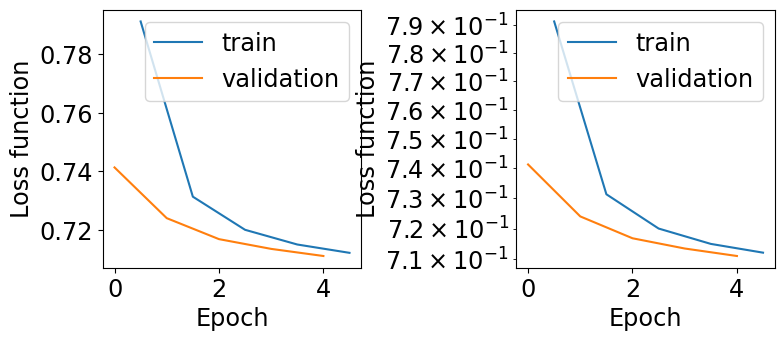

In [27]:
def passengerSatisfaction(x_train, y_train, x_val, y_val):

    #Model definition
    inputShape = (22,)
    nNeurons = np.array([6, 4])
    model = getModel(inputShape, nNeurons, hiddenActivation="relu", outputActivation="sigmoid")


    #Training
 
    initial_learning_rate = 1E-3
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate,
                    decay_steps=1000,
                    decay_rate=0.95,
                    staircase=True)
    #delete legacy if not mac m1/m2
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=lr_schedule),
                      loss=tf.keras.losses.BinaryCrossentropy(),
                      metrics=['Accuracy','FalsePositives'])
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1)
    
    nEpochs = 5
    history = model.fit(x=x_train, y=y_train, 
                        epochs=nEpochs, 
                        batch_size = 32,
                        validation_data=(x_val, y_val),
                        callbacks=[callback],
                        verbose=0)
    
    #Plotting
    
    plf.plotTrainHistory(history)
    model.evaluate(x_train, y_train)
    
    val_loss, val_acc, val_fpr = model.evaluate(x_val, y_val)
    val_fpr /= np.sum(1-y_val)
    
    print(("Validation accuracy:","blue"),val_acc)
    print(("Validation FPR","blue"),val_fpr)
    return model

modelQ = passengerSatisfaction(x_train.values, y_train.values, x_val.values, y_val.values);

## Models comparision 


In [33]:
val_loss, val_acc, val_fpr = model.evaluate(x_val, y_val)
val_fpr /= np.sum(1-y_val)

val_lossQ, val_accQ, val_fprQ = modelQ.evaluate(x_val, y_val)
val_fprQ /= np.sum(1-y_val)
print(("Validation accuracy classic model:"),val_acc)
print(("Validation FPR classic model"),val_fpr)

print(("Validation accuracy quantum model:"),val_accQ)
print(("Validation FPR quantum model"),val_fprQ)

125/125 [==============================] - 2s 20ms/step - loss: 0.7111 - Accuracy: 0.5667 - false_positives: 0.0000e+00
Validation accuracy classic model: 0.8324999809265137
Validation FPR classic model 0.033083370092633436
Validation accuracy quantum model: 0.5667499899864197
Validation FPR quantum model 0.0
